**NYC AIRBNB EDA PROJECT**

Variable Understanding:
Listing_id :- This is a unique identifier for each listing in the dataset.  
Listing_name :- This is the name or title of the listing, as it appears on the Airbnb website.  
Host_id :- This is a unique identifier for each host in the dataset.  
Host_name :- This is the name of the host as it appears on the Airbnb website.  
Neighbourhood_group :- This is a grouping of neighbourhoods in New York City, such as Manhattan or Brooklyn.  
Neighbourhood :- This is the specific neighbourhood in which the listing is located.  
Latitude :- This is the geographic latitude of the listing.  
Longitude :- This is the geographic longitude of the listing.  
Room_type :- This is the type of room or property being offered, such as an entire home, private room, shared room.  
Price :- This is the nightly price for the listing, in US dollars.  
Minimum_nights :- This is the minimum number of nights that a guest must stay at the listing.  
Total_reviews :- This is the total number of reviews that the listing has received.  
Reviews_per_month :- This is the average number of reviews that the listing receives per month.  
Host_listings_count :- This is the total number of listings that the host has on Airbnb.  
Availability_365 :- This is the number of days in the next 365 days that the listing is available for booking.  

In [ ]:
## Importing the libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import matplotlib.image as mpimg
import plotly.express as px
import folium
from folium.plugins import HeatMap
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize

In [ ]:
import sklearn.metrics       as Metrics
import folium  #needed for interactive map
import plotly.graph_objects as go
from   sklearn                 import preprocessing
from   sklearn                 import decomposition
from   sklearn.metrics         import r2_score
from   sklearn.manifold        import TSNE
from   sklearn.cluster         import KMeans
from   sklearn                 import metrics
from   scipy.cluster           import hierarchy
from   scipy.spatial.distance  import pdist
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
sns.set(style='white')
mapbox_token ='pk.eyJ1IjoibWFnZ2llNjE2IiwiYSI6ImNrMnFvOGZhazAwdXYzY3BydHYxMnV2ZXMifQ.kgmjVzysiQkB8aKVBylDhQ'
import warnings
warnings.filterwarnings("ignore")

In [ ]:
## Load the data
data=pd.read_csv("/content/Airbnb NYC 2019.csv")

In [ ]:
data.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


**Data Preprocessing**

In [ ]:
# check duplicate rows in dataset
data = data.drop_duplicates()
data.count()

id                                48895
name                              48879
host_id                           48895
host_name                         48874
neighbourhood_group               48895
neighbourhood                     48895
latitude                          48895
longitude                         48895
room_type                         48895
price                             48895
minimum_nights                    48895
number_of_reviews                 48895
last_review                       38843
reviews_per_month                 38843
calculated_host_listings_count    48895
availability_365                  48895
dtype: int64

no duplicates


In [ ]:
# checking null values of each columns
data.isnull().sum()

id                                    0
name                                 16
host_id                               0
host_name                            21
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10052
reviews_per_month                 10052
calculated_host_listings_count        0
availability_365                      0
dtype: int64

In [ ]:
#host_name and listing_name are not that much of null values, so first we are good to fill those with some substitutes in both the columns first.
data['name'].fillna('unknown',inplace=True)
data['host_name'].fillna('no_name',inplace=True)

In [ ]:
#null values are now removed
data[['host_name','name']].isnull().sum()

host_name    0
name         0
dtype: int64

In [ ]:
# last_review and reviews_per_month have total 10052 null values each.
# last_review column is not required for our analysis as compared to number_of_reviews & reviews_per_month
data = data.drop(['last_review'], axis=1)     #removing last_review column beacause of not that much important


In [ ]:
data.info()      #last_review column is deleted

<class 'pandas.core.frame.DataFrame'>
Int64Index: 48895 entries, 0 to 48894
Data columns (total 15 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              48895 non-null  int64  
 1   name                            48895 non-null  object 
 2   host_id                         48895 non-null  int64  
 3   host_name                       48895 non-null  object 
 4   neighbourhood_group             48895 non-null  object 
 5   neighbourhood                   48895 non-null  object 
 6   latitude                        48895 non-null  float64
 7   longitude                       48895 non-null  float64
 8   room_type                       48895 non-null  object 
 9   price                           48895 non-null  int64  
 10  minimum_nights                  48895 non-null  int64  
 11  number_of_reviews               48895 non-null  int64  
 12  reviews_per_month               

In [ ]:
data.describe()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,4.889500e+04,4.889500e+04,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,38843.000000,48895.000000,48895.000000
mean,1.901714e+07,6.762001e+07,40.728949,-73.952170,152.720687,7.029962,23.274466,1.373221,7.143982,112.781327
std,1.098311e+07,7.861097e+07,0.054530,0.046157,240.154170,20.510550,44.550582,1.680442,32.952519,131.622289
min,2.539000e+03,2.438000e+03,40.499790,-74.244420,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000
25%,9.471945e+06,7.822033e+06,40.690100,-73.983070,69.000000,1.000000,1.000000,0.190000,1.000000,0.000000
50%,1.967728e+07,3.079382e+07,40.723070,-73.955680,106.000000,3.000000,5.000000,0.720000,1.000000,45.000000
75%,2.915218e+07,1.074344e+08,40.763115,-73.936275,175.000000,5.000000,24.000000,2.020000,2.000000,227.000000
max,3.648724e+07,2.743213e+08,40.913060,-73.712990,10000.000000,1250.000000,629.000000,58.500000,327.000000,365.000000


In [ ]:
#replacing reviews per month nan values with 0
data['reviews_per_month'].fillna(0, inplace=True)
data['reviews_per_month'].isnull().sum()  #null values replaced by 0

0

**Clean Price Variable :** As the price column consist of 0's(11 obs) so we remove them as they do not add any value in our analysis


In [ ]:
data.drop(data[data['price'] <=0].index,inplace=True)

***Dealing with Outliers using IQR Technique***

In [ ]:
Q1 = np.percentile(data['price'], 25)
Q3 = np.percentile(data['price'], 75)
IQR = Q3 - Q1
lower_range = Q1 - (1.5 * IQR)
upper_range = Q3 + (1.5 * IQR)
print(f"IQR is {IQR}, lower_range is {lower_range} and upper_range is {upper_range}")

IQR is 106.0, lower_range is -90.0 and upper_range is 334.0


In [ ]:
data[data['price'] > 333].count()[0] / data.shape[0] * 100 #outliers are 6.08% of total data

6.089927174535635

In [ ]:
data = data[(data.price > lower_range) & (data.price < upper_range)] #removing outliers

In [ ]:
top_neighbour = data['neighbourhood_group'].value_counts().to_frame(name='count').nlargest(5,'count').reset_index().rename(columns={'index':'neighbourhood_group'})
popular_neighbourhood = data[data['neighbourhood_group'].isin(top_neighbour['neighbourhood_group'])]

In [ ]:
top_neighbour

,neighbourhood_group,count
0,Manhattan,19500
1,Brooklyn,19406
2,Queens,5567
3,Bronx,1069
4,Staten Island,365


<Axes: xlabel='neighbourhood_group'>

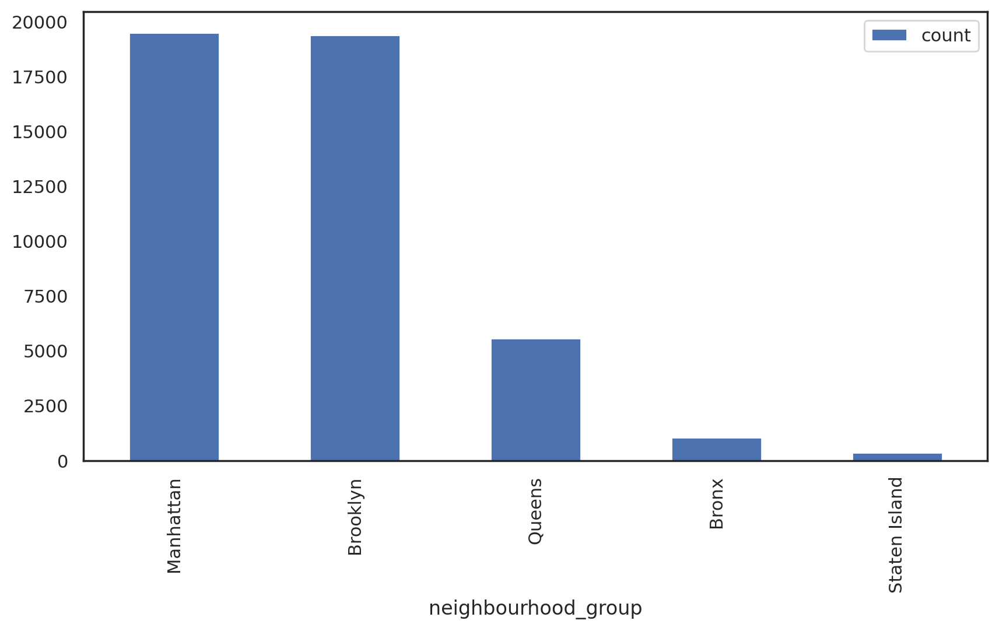

In [ ]:
top_neighbour.plot(x='neighbourhood_group',kind='bar',figsize=(10,5))

**Interpretation**
Manhattan and Brooklyn are the most popular neighbourhood_group based on their listings.

Let's try to understand how the price and availability vary for these neighbourhood_group

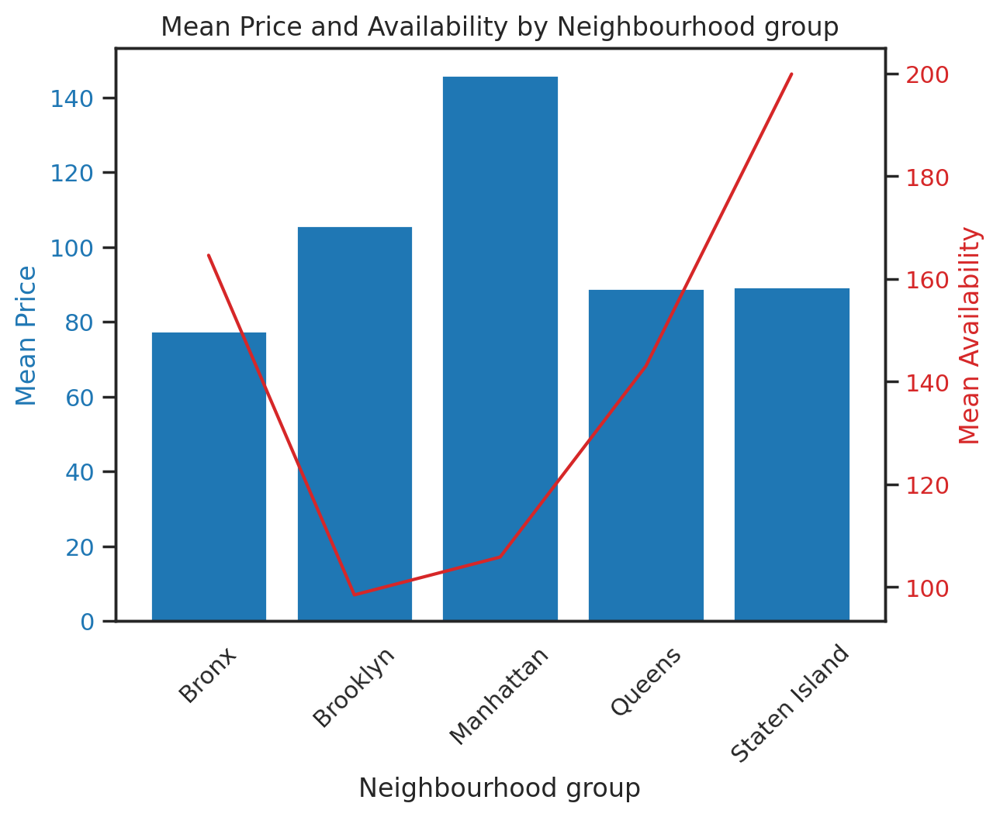

In [ ]:
# Group by neighbourhood_group and calculate the mean price and availability
mean_price_by_neighbourhood = popular_neighbourhood.groupby('neighbourhood_group')['price'].mean()
mean_avail_by_neighbourhood = popular_neighbourhood.groupby('neighbourhood_group')['availability_365'].mean()

# Create a figure and axis
fig, ax1 = plt.subplots()

# Plot mean price on the left y-axis
color = 'tab:blue'
ax1.set_xlabel('Neighbourhood group')
ax1.set_ylabel('Mean Price', color=color)
ax1.bar(mean_price_by_neighbourhood.index, mean_price_by_neighbourhood, color=color)
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45)
ax1.tick_params(axis='y', labelcolor=color)

# Create a second y-axis for mean availability
ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel('Mean Availability', color=color)
ax2.plot(mean_avail_by_neighbourhood.index, mean_avail_by_neighbourhood, color=color)
ax2.tick_params(axis='y', labelcolor=color)

# Set the title
plt.title('Mean Price and Availability by Neighbourhood group')

# Show the plot
plt.show()


**Interpretation**
1. Brooklyn has the lowest availability and has 2nd highest price where as Manhattan has low availability with highest price
2. Staten Island is affordable and has highest availability of 200 days per year.
3. The prices are high for Williamsburg ,Upper west side as it is in the Manhattan which is the main city with high popularity and many famous spots in New York
4. But the other neighbourhood such as BedFord-Stuyvesant of Brooklyn are less famous as they are far from main region of New York so the prices are low.

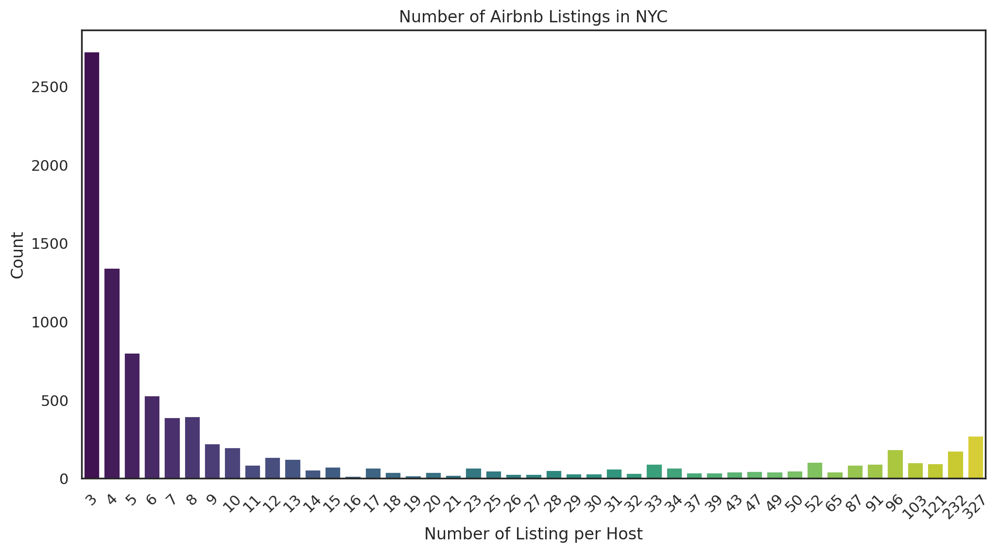

In [ ]:
df = data[data.calculated_host_listings_count > 2]
# Number of listings
plt.figure(figsize=(12, 6))
sns.countplot(x='calculated_host_listings_count', data=df, palette='viridis')
plt.title('Number of Airbnb Listings in NYC')
plt.xlabel('Number of Listing per Host')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

**INTERPRETATION**

There are high number of hosts with number of listing between 2-6.  
Number of hosts having listing more than 7 are less than 500 per listing.  
Hightest number of listings per host is 327, around 350 hosts have these many properties in NYC.  

**Feature Engineering**  
We created a new column named "occupancy rate" which tells us about the occupany percentage of each listing.

In [ ]:
data['Occupancy Rate_avail'] = (data['availability_365'] / 365 )* 100

In [ ]:
neighbourhood_group_stats = data.groupby('neighbourhood_group').agg(
    num_listings=('id', 'count'),
    avg_price=('price', 'mean'),
    avg_availability=('availability_365', 'mean'),
    Occupancy_rate=('Occupancy Rate_avail', 'mean')
)
top_neighbour = data['neighbourhood'].value_counts().to_frame(name='count').nlargest(5,'count')
popular_neighbourhood = data[data['neighbourhood'].isin(top_neighbour.index)]

popular_neighbourhood_stats = popular_neighbourhood.groupby('neighbourhood').agg(
    num_listings=('id', 'count'),
    avg_price=('price', 'mean'),
    avg_availability=('availability_365', 'mean'),
    Occupancy_rate=('Occupancy Rate_avail', 'mean')
)
neighbourhood_group_stats.reset_index(inplace=True)
popular_neighbourhood_stats.reset_index(inplace=True)

neighbourhood_group_stats


,neighbourhood_group,num_listings,avg_price,avg_availability,Occupancy_rate
0,Bronx,1069,77.437792,164.599626,45.095788
1,Brooklyn,19406,105.748634,98.484335,26.982010
2,Manhattan,19500,145.912103,105.843128,28.998117
3,Queens,5567,88.904437,143.019041,39.183299
4,Staten Island,365,89.235616,199.893151,54.765247


In [ ]:
popular_neighbourhood_stats

,neighbourhood,num_listings,avg_price,avg_availability,Occupancy_rate
0,Bedford-Stuyvesant,3634,94.019538,115.322234,31.595133
1,Bushwick,2435,79.978645,94.341273,25.846924
2,Harlem,2585,103.536944,104.954352,28.754617
3,Upper West Side,1788,148.526846,90.967002,24.922466
4,Williamsburg,3731,124.239882,70.576253,19.335960


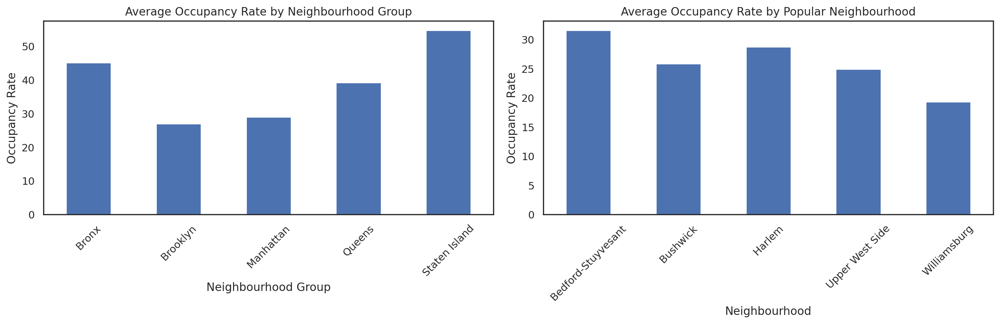

In [ ]:
avg_occupancy_by_neighbourhood_group = data.groupby("neighbourhood_group")["Occupancy Rate_avail"].mean()

avg_occupancy_by_popular_neighbourhood = popular_neighbourhood.groupby("neighbourhood")["Occupancy Rate_avail"].mean()

fig, axes = plt.subplots(1, 2, figsize=(15, 5))

# Plot the first bar chart on the first subplot
avg_occupancy_by_neighbourhood_group.plot(kind="bar", ax=axes[0])
axes[0].set_title("Average Occupancy Rate by Neighbourhood Group")
axes[0].set_xlabel("Neighbourhood Group")
axes[0].set_ylabel("Occupancy Rate")
axes[0].tick_params(axis='x', rotation=45)

# Plot the second bar chart on the second subplot
avg_occupancy_by_popular_neighbourhood.plot(kind="bar", ax=axes[1])
axes[1].set_title("Average Occupancy Rate by Popular Neighbourhood")
axes[1].set_xlabel("Neighbourhood")
axes[1].set_ylabel("Occupancy Rate")
axes[1].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

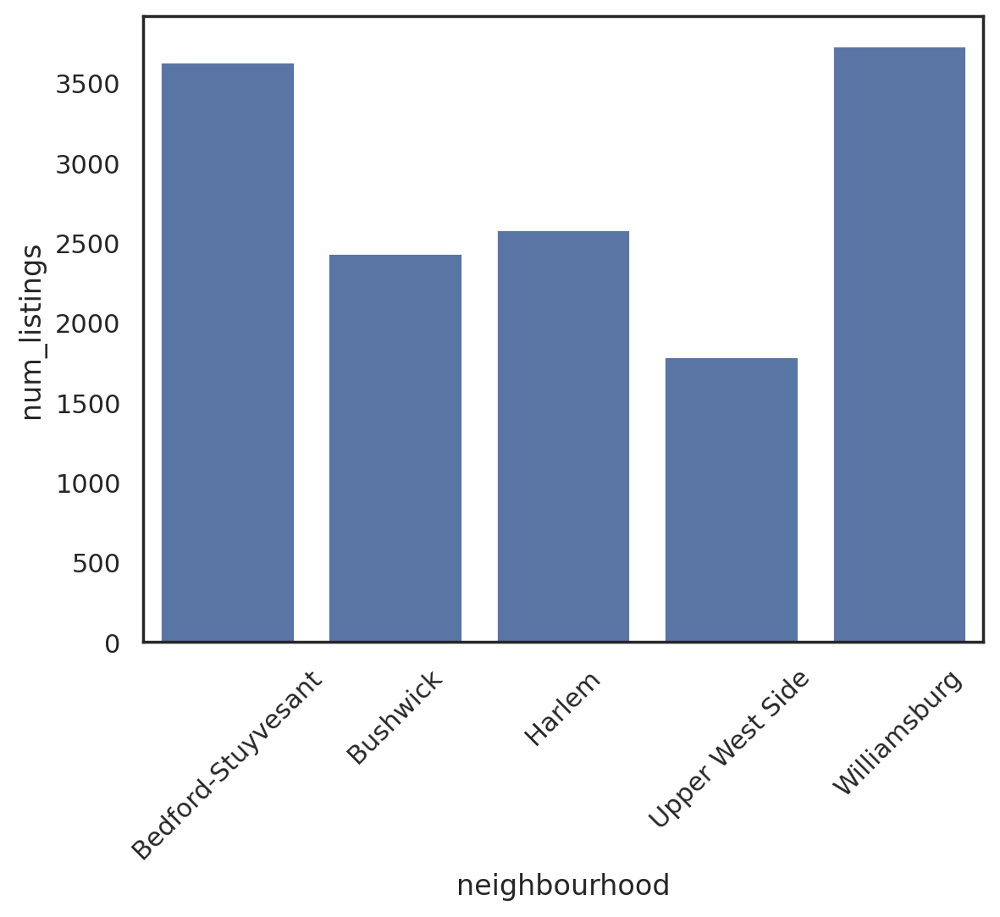

In [ ]:
sns.barplot(data=popular_neighbourhood_stats, x='neighbourhood',y='num_listings').tick_params(axis='x', rotation=45)

**Interpretation**
1. Here BedFord-Stuyvesant and Williamsburg are most popular neighbourhood with high avg availability and Occupancy_rate.
2. Also Upper West Side is not that famous but has highest avg price.
3. This must be due to the 80/20 rule that only 20 % of the customers are premium customers and other 80% are the average one's.
4. The occupancy rate is mostly 0-20% and very few has > 20% occupancy rate.
5. Staten Island has the highest occupancy and Bronx is the 2nd highest.

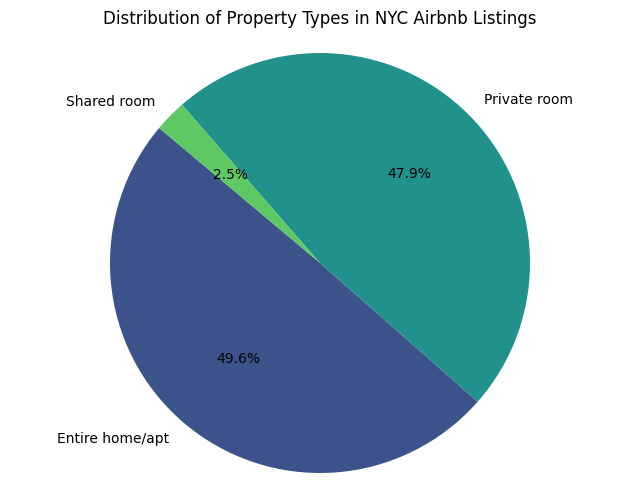

Entire home/apt    22782
Private room       21989
Shared room         1136
Name: room_type, dtype: int64room_type
Entire home/apt    162.503731
Private room        79.043658
Shared room         59.397887
Name: price, dtype: float64


In [ ]:
# Analyze the distribution of property types
property_type_distribution = data['room_type'].value_counts()

# Create a pie chart
plt.figure(figsize=(8, 6))
plt.pie(property_type_distribution, labels=property_type_distribution.index, autopct='%1.1f%%', startangle=140, colors=sns.color_palette('viridis', len(property_type_distribution)))
plt.title('Distribution of Property Types in NYC Airbnb Listings')
plt.axis('equal')
plt.show()

print(property_type_distribution,end="")

# Calculate the average pricing for each type of room
average_price_by_room_type = data.groupby('room_type')['price'].mean()

print(average_price_by_room_type)


**Interpretation**

Entire home/apt is the most booked room type followed by private rooms and shared rooms are booked the least, we also see that shared room price has a very cheap average price for their room


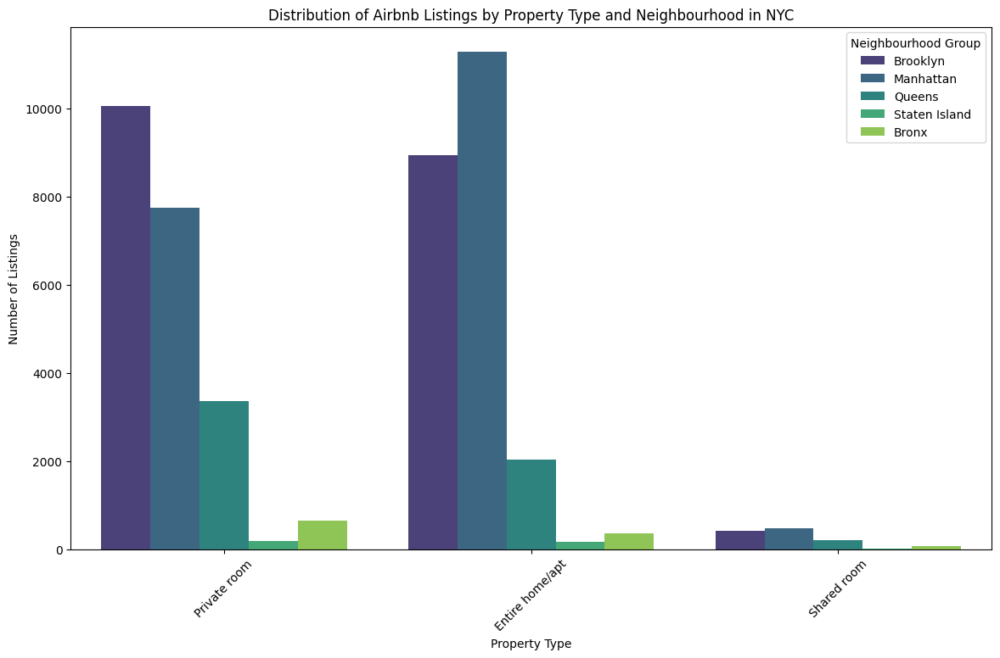

In [ ]:
plt.figure(figsize=(14, 8))
sns.countplot(x='room_type', hue='neighbourhood_group', data=data, palette='viridis')
plt.title('Distribution of Airbnb Listings by Property Type and Neighbourhood in NYC')
plt.xlabel('Property Type')
plt.ylabel('Number of Listings')
plt.xticks(rotation=45)
plt.legend(title='Neighbourhood Group')
plt.show()

**INTERPRETATION**  
1. Brooklyn has highest number of private rooms whereas Manhattan is famous for Entire home/apt.
2. Also the shared rooms are very less compared to other types must be because people prefer to rent it out than to share it.

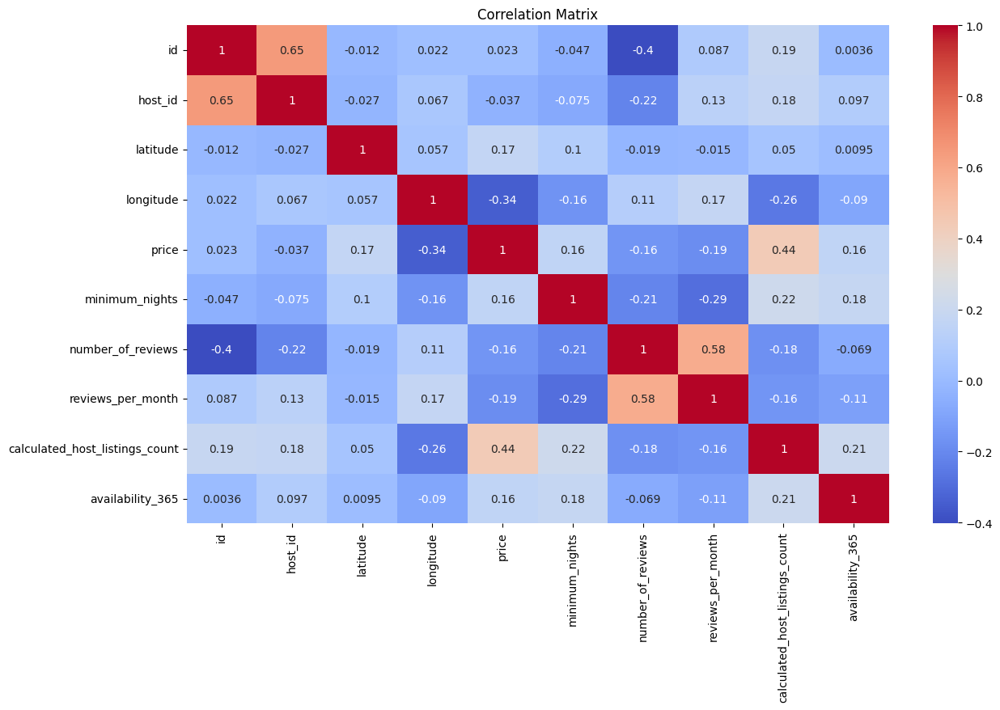

In [ ]:
plt.figure(figsize=(14, 8))
numeric_cols = df.select_dtypes(include=['int64', 'float64'])
corr_matrix = numeric_cols.corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title("Correlation Matrix")
plt.show()

**Interpretation**
Price has positive correlation of 0.16 with minimum nights for listing.  
Also it has a negative correlation with reviews_per_month as the price increases customers are more robust to go for that room.  
Also it has a high positive correlation(0.44) with host listings count as more the number of listings higher the prices.  

<Figure size 1200x800 with 0 Axes>

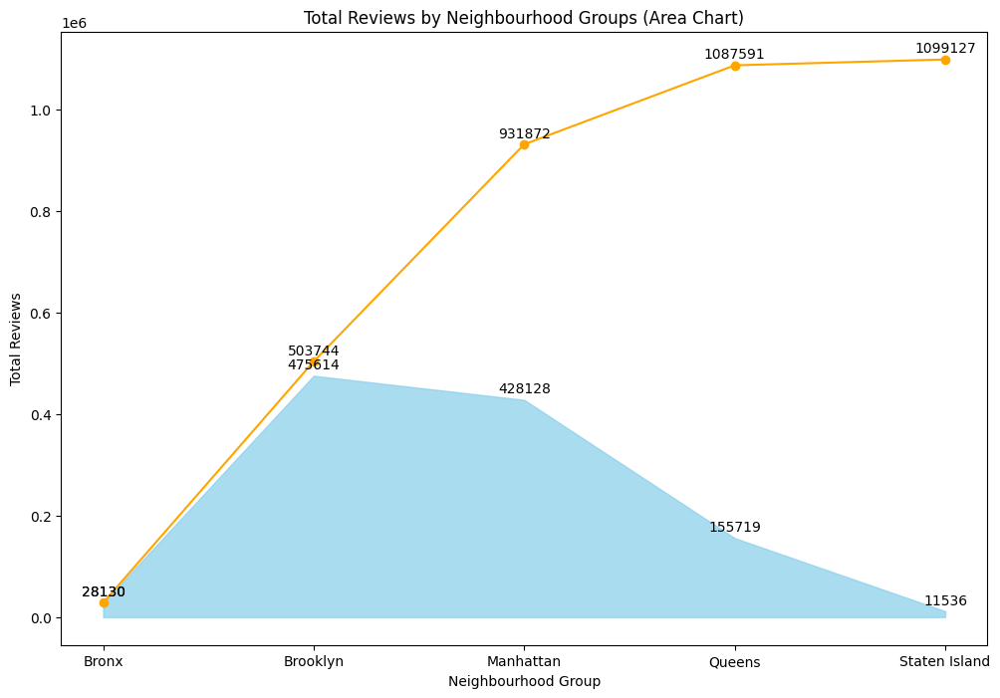

In [ ]:
# Create a stacked bar chart using Matplotlib
plt.figure(figsize=(12, 8))

# Group by Neighbourhood_Group to find total reviews
grouped_reviews = data.groupby('neighbourhood_group')['number_of_reviews'].sum().reset_index()

# Calculate cumulative total reviews
grouped_reviews['Cumulative_Reviews'] = grouped_reviews['number_of_reviews'].cumsum()

# Create an area chart using Matplotlib
plt.figure(figsize=(12, 8))

# Area chart for total reviews
plt.fill_between(grouped_reviews['neighbourhood_group'], grouped_reviews['number_of_reviews'], color='skyblue', alpha=0.7)
for i, txt in enumerate(grouped_reviews['number_of_reviews']):
    plt.annotate(txt, (grouped_reviews['neighbourhood_group'][i], grouped_reviews['number_of_reviews'][i]), textcoords="offset points", xytext=(0, 5), ha='center')


# Cumulative line plot
plt.plot(grouped_reviews['neighbourhood_group'], grouped_reviews['Cumulative_Reviews'], color='orange', marker='o', label='Cumulative Total Reviews')
for i, txt in enumerate(grouped_reviews['Cumulative_Reviews']):
    plt.annotate(txt, (grouped_reviews['neighbourhood_group'][i], grouped_reviews['Cumulative_Reviews'][i]), textcoords="offset points", xytext=(0, 5), ha='center')


# Plot labels and title
plt.title('Total Reviews by Neighbourhood Groups (Area Chart)')
plt.xlabel('Neighbourhood Group')
plt.ylabel('Total Reviews')

plt.show()

**INTERPRETATION**  

The total number of reviews are 11,37,077.  
Maximum reviews for the neighbourhood groups are: Bronx - 28k
Brooklyn - 486k
Manhattan - 454k   
Queens - 157k  
Staten Island - 11.5k
The highest reviews are for the listing of brooklyn followed by Manhattan and then Queens.  
Reviews of Staten Island are the least.  

Text(0.5, 1.0, 'Density and distribution of prices for each neighbourhood_group')

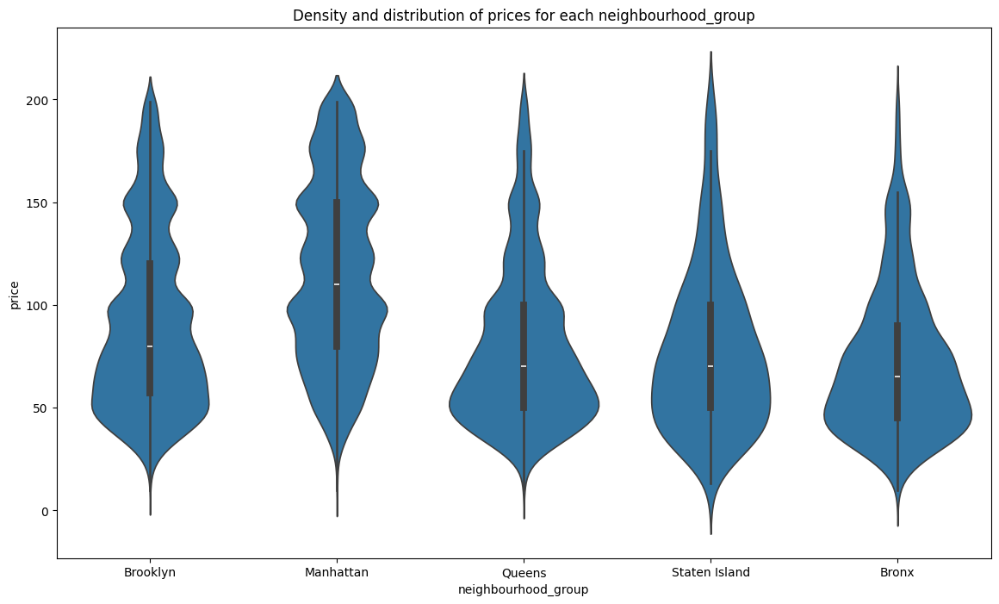

In [ ]:
plt.figure(figsize=(14, 8))
#creating a sub-dataframe with no extreme values / less than 200
df10=data[data.price < 200]
#using violinplot to showcase density and distribtuion of prices
viz_2=sns.violinplot(data=df10, x='neighbourhood_group', y='price')
viz_2.set_title('Density and distribution of prices for each neighbourhood_group')

**INTERPRETATION**
Price variation is as follows:  

1. Brooklyn - Highest density of price is around 50 and the density decreases gradually with increase in price.  
2. Manhattan - It's no secret that manhattan is one of the most expensive city to leave and out graph tells us  nothing less. Density is almost equally spread across all price range and has the lowest density/width in compare to other neighbourhoods. It's median is also the highest, almost around 110$.  
3. The spread of Queens and Bronx seems almost same. Only major diffrence is that with increase in price range.  
4. The density of Bronx is lower than Queens and Bronx has a bit more density towards lower price range  
5. The density of Staten Islan has quit a range, with lower price of about 25 and higher price of about 75, it has good density spread.The density narrows down with increase in price.  

In [ ]:
data.head(1)

,id,name,host_id,host_name,neighbourhood,latitude,longitude,price,minimum_nights,number_of_reviews,...,availability_365,Occupancy Rate_avail,neighbourhood_group_Bronx,neighbourhood_group_Brooklyn,neighbourhood_group_Manhattan,neighbourhood_group_Queens,neighbourhood_group_Staten Island,room_type_Entire home/apt,room_type_Private room,room_type_Shared room
0,2539,Clean & quiet apt home by the park,2787,John,Kensington,40.64749,-73.97237,149,1,9,...,365,100.0,0,1,0,0,0,0,1,0


In [ ]:
data = pd.get_dummies(data, columns=['neighbourhood_group', 'room_type'], prefix=['neighbourhood_group', 'room_type'])
data.head(2)

,id,name,host_id,host_name,neighbourhood,latitude,longitude,price,minimum_nights,number_of_reviews,...,availability_365,Occupancy Rate_avail,neighbourhood_group_Bronx,neighbourhood_group_Brooklyn,neighbourhood_group_Manhattan,neighbourhood_group_Queens,neighbourhood_group_Staten Island,room_type_Entire home/apt,room_type_Private room,room_type_Shared room
0,2539,Clean & quiet apt home by the park,2787,John,Kensington,40.64749,-73.97237,149,1,9,...,365,100.000000,0,1,0,0,0,0,1,0
1,2595,Skylit Midtown Castle,2845,Jennifer,Midtown,40.75362,-73.98377,225,1,45,...,355,97.260274,0,0,1,0,0,1,0,0


In [ ]:
print(data.shape)
print(data.columns)

(45907, 22)
Index(['id', 'name', 'host_id', 'host_name', 'neighbourhood', 'latitude',
       'longitude', 'price', 'minimum_nights', 'number_of_reviews',
       'reviews_per_month', 'calculated_host_listings_count',
       'availability_365', 'Occupancy Rate_avail', 'neighbourhood_group_Bronx',
       'neighbourhood_group_Brooklyn', 'neighbourhood_group_Manhattan',
       'neighbourhood_group_Queens', 'neighbourhood_group_Staten Island',
       'room_type_Entire home/apt', 'room_type_Private room',
       'room_type_Shared room'],
      dtype='object')


In [ ]:
X= data.drop(columns=['name','id','host_id','neighbourhood','host_name']) ## removing unecessary variables for pca
X_norm = preprocessing.scale(X)

In [ ]:
X_norm.shape

(45907, 17)

In [41]:
pca = decomposition.PCA(n_components=10)
X_centered = X_norm - X_norm.mean(axis=0)
pca.fit(X_centered)
X_pca = pca.transform(X_centered)

In [42]:
X_pca.shape

(45907, 10)

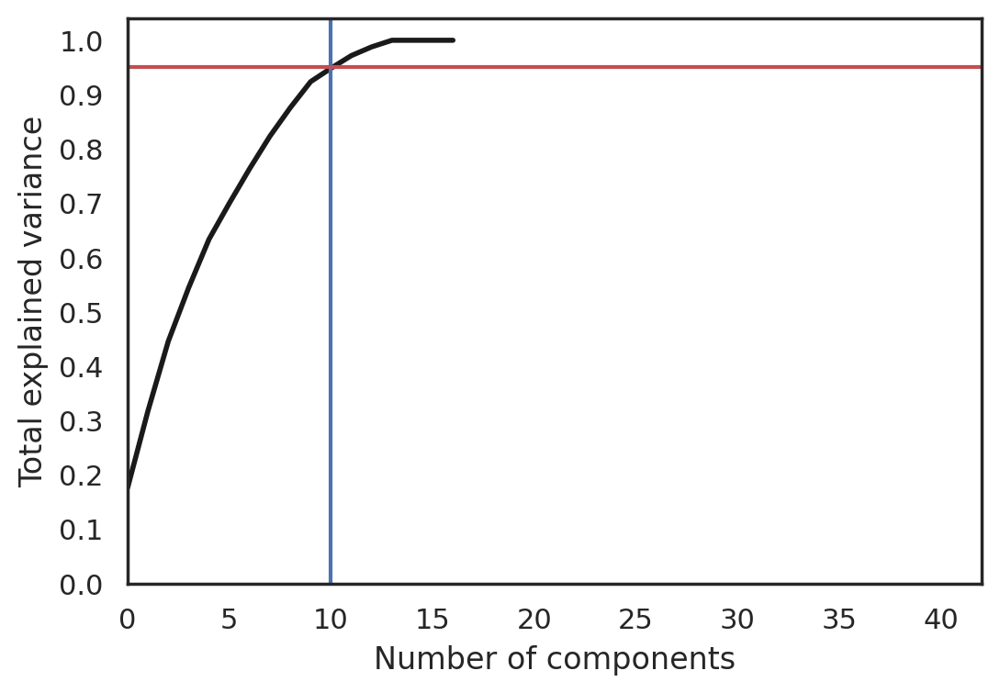

In [ ]:
pca = decomposition.PCA().fit(X_centered)
plt.figure(figsize=(6,4))
plt.plot(np.cumsum(pca.explained_variance_ratio_), color='k', lw=2)
plt.xlabel('Number of components')
plt.ylabel('Total explained variance')
plt.xlim(0, 42)
plt.yticks(np.arange(0, 1.1, 0.1))
plt.axvline(10, c='b')
plt.axhline(0.95, c='r')
plt.show();

* 4 components can represent about 50% information of X
* 10 components can represent about 95% information of X

**Let's print our 10 principal components and also see how much variance is explained by each component.**

In [ ]:
#features that compose each component
total_variance = 0
for i, component in enumerate(pca.components_):
    print("{} component: {}% of initial variance".format(i + 1,
          round(100 * pca.explained_variance_ratio_[i], 2)))
    total_variance += round(100 * pca.explained_variance_ratio_[i],2)
    print(f"Total Variance explained until now is : {total_variance}")
    print(pd.DataFrame(zip(component,X.columns)).sort_values(by=0,ascending=False))
    if total_variance >= 95:
      break

1 component: 17.61% of initial variance
Total Variance explained until now is : 17.61
           0                                  1
2   0.435358                              price
14  0.424277          room_type_Entire home/apt
11  0.404779      neighbourhood_group_Manhattan
0   0.195802                           latitude
6   0.159274     calculated_host_listings_count
3   0.094011                     minimum_nights
13  0.009814  neighbourhood_group_Staten Island
8  -0.014728               Occupancy Rate_avail
7  -0.014728                   availability_365
16 -0.039346              room_type_Shared room
9  -0.051265          neighbourhood_group_Bronx
4  -0.072417                  number_of_reviews
5  -0.101136                  reviews_per_month
12 -0.207337         neighbourhood_group_Queens
10 -0.254141       neighbourhood_group_Brooklyn
1  -0.310207                          longitude
15 -0.412405             room_type_Private room
2 component: 14.15% of initial variance
Total Vari

**Clustering**  
**Kmeans**

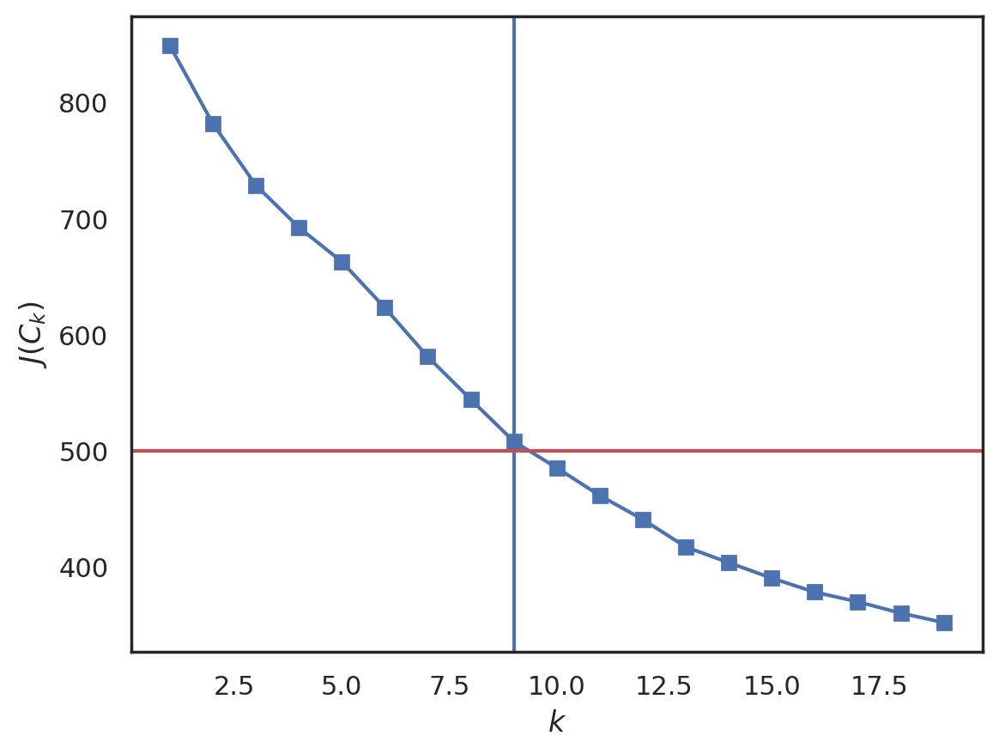

In [39]:
pca = decomposition.PCA(n_components=10)
X_reduced = pca.fit_transform(X_centered)
inertia = []
for k in range(1, 20):
    kmeans = KMeans(n_clusters=k, random_state=1).fit(X_reduced)
    inertia.append(np.sqrt(kmeans.inertia_))

plt.plot(range(1, 20), inertia, marker='s');
plt.axvline(9, c='b')
plt.axhline(500, c='r')
plt.xlabel('$k$')
plt.ylabel('$J(C_k)$');

In this plot we can observe that for the values of **k > 9** the inertia tends to layoff so we can get clusters within the range of 7 to 11 and then select the best cluster with k centers.  
**Let's plot the clusters with 7 , 8 , 9 , 10 centers**

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 45907 samples in 0.009s...
[t-SNE] Computed neighbors for 45907 samples in 16.814s...
[t-SNE] Computed conditional probabilities for sample 1000 / 45907
[t-SNE] Computed conditional probabilities for sample 2000 / 45907
[t-SNE] Computed conditional probabilities for sample 3000 / 45907
[t-SNE] Computed conditional probabilities for sample 4000 / 45907
[t-SNE] Computed conditional probabilities for sample 5000 / 45907
[t-SNE] Computed conditional probabilities for sample 6000 / 45907
[t-SNE] Computed conditional probabilities for sample 7000 / 45907
[t-SNE] Computed conditional probabilities for sample 8000 / 45907
[t-SNE] Computed conditional probabilities for sample 9000 / 45907
[t-SNE] Computed conditional probabilities for sample 10000 / 45907
[t-SNE] Computed conditional probabilities for sample 11000 / 45907
[t-SNE] Computed conditional probabilities for sample 12000 / 45907
[t-SNE] Computed conditional probabilities for s

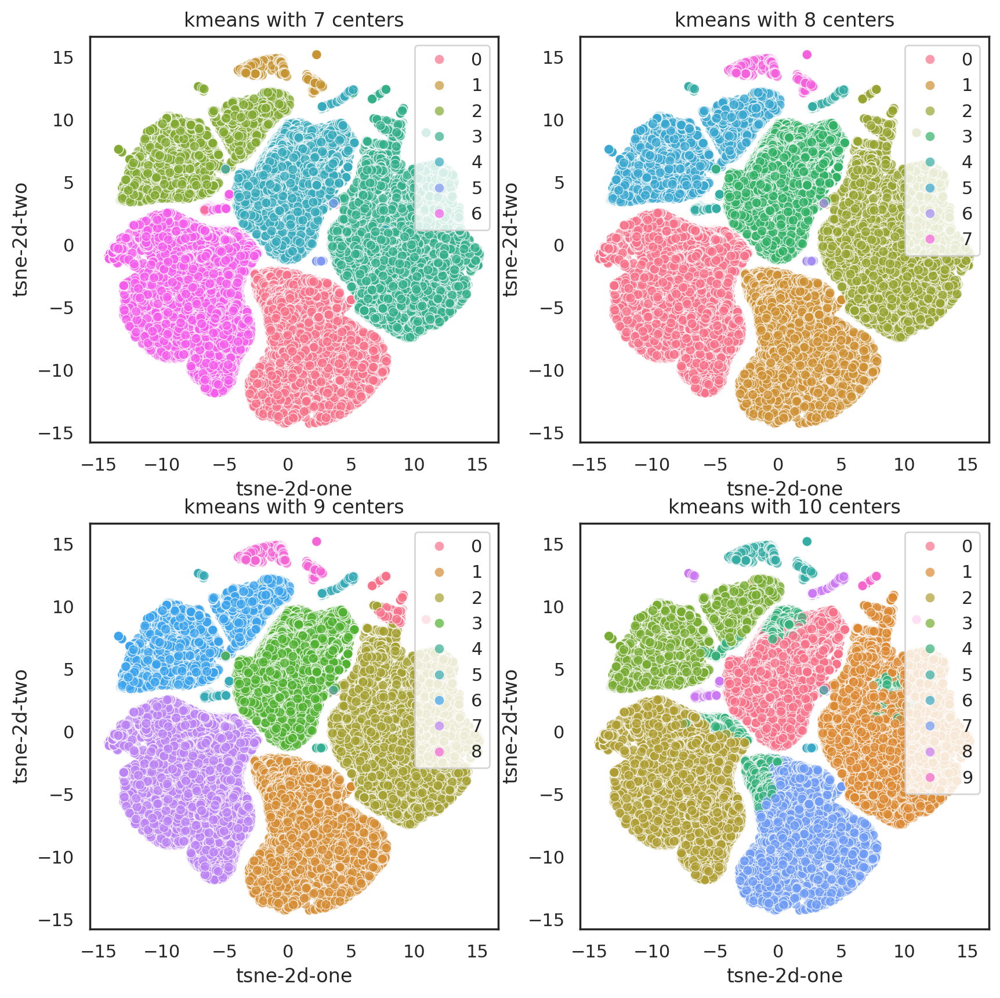

In [44]:
#visuliaze result with tsne
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(X_norm)
df_subset = pd.DataFrame()
df_subset['tsne-2d-one'] = tsne_results[:,0]
df_subset['tsne-2d-two'] = tsne_results[:,1]

fig, axes = plt.subplots(2, 2,figsize=(10,10))
for i in range(7,11):
    y_pred= KMeans(n_clusters=i, random_state=170,max_iter=2000).fit_predict(X_pca)

    ax = axes[int((i-7)/2), (i-7)%2]

    ax.set_title(f'kmeans with {i} centers')

    sns.scatterplot(x="tsne-2d-one", y="tsne-2d-two", hue=y_pred,palette=sns.color_palette("husl",i),
                   data = df_subset,legend='full',alpha=0.7,ax=ax)

plt.show()

**The kmeans cluster with 8 centers has the optimal clustering performance.**

**Hierarchy clustering**

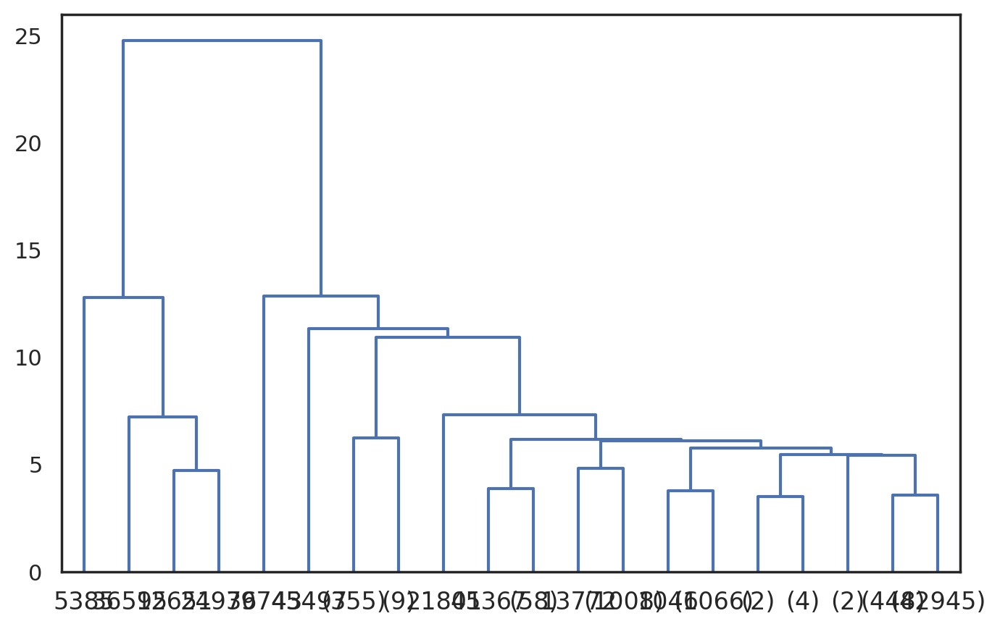

In [ ]:
distance_mat = pdist(X_reduced)
Z = hierarchy.linkage(distance_mat, 'single')
plt.figure(figsize=(8, 5))
dn = hierarchy.dendrogram(Z, color_threshold=0.2, truncate_mode='lastp', p=20)

In [45]:
kmeans_pred = KMeans(n_clusters=10, random_state=170,max_iter=2000).fit_predict(X_reduced)
data['kmeans_pred'] = kmeans_pred

**Box Plot**

In [46]:
from plotly.offline import iplot, init_notebook_mode
import cufflinks as cf

In [47]:
def draw_box(df,features,n):
    df=df.loc[df.kmeans_pred<10]
    fig = []

    for i in range(len(features)):
        table=df.pivot(values=f'{features[i]}',columns='kmeans_pred')
        fig.append(table.figure(kind='box',boxpoints='all',showlegend=False))

    iplot(cf.subplots(fig,shape=(n,2),subplot_titles=(features)))

In [ ]:
data.columns

Index(['id', 'name', 'host_id', 'host_name', 'neighbourhood', 'latitude',
       'longitude', 'price', 'minimum_nights', 'number_of_reviews',
       'reviews_per_month', 'calculated_host_listings_count',
       'availability_365', 'neighbourhood_group_Bronx',
       'neighbourhood_group_Brooklyn', 'neighbourhood_group_Manhattan',
       'neighbourhood_group_Queens', 'neighbourhood_group_Staten Island',
       'room_type_Entire home/apt', 'room_type_Private room',
       'room_type_Shared room', 'kmeans_pred'],
      dtype='object')

**Airbnb characters**

In [ ]:
draw_box(data,['number_of_reviews','price'],1)

In [48]:
draw_box(data,['Occupancy Rate_avail','minimum_nights'],1)

In [36]:
data.columns

Index(['id', 'name', 'host_id', 'host_name', 'neighbourhood', 'latitude',
       'longitude', 'price', 'minimum_nights', 'number_of_reviews',
       'reviews_per_month', 'calculated_host_listings_count',
       'availability_365', 'Occupancy Rate_avail', 'neighbourhood_group_Bronx',
       'neighbourhood_group_Brooklyn', 'neighbourhood_group_Manhattan',
       'neighbourhood_group_Queens', 'neighbourhood_group_Staten Island',
       'room_type_Entire home/apt', 'room_type_Private room',
       'room_type_Shared room'],
      dtype='object')